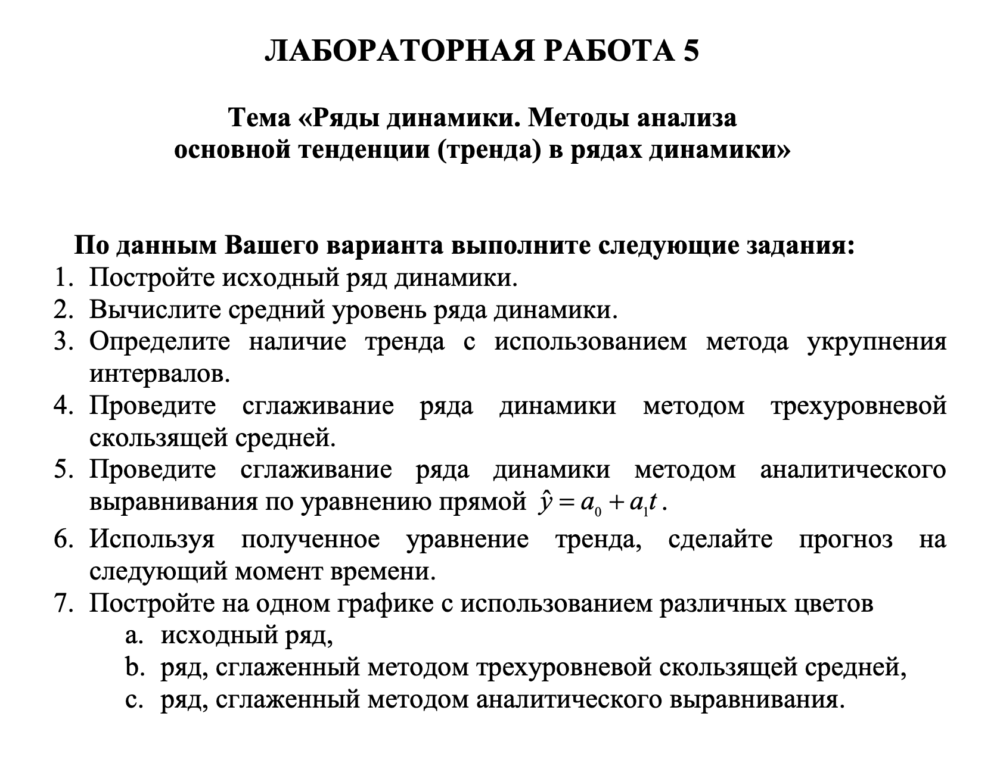

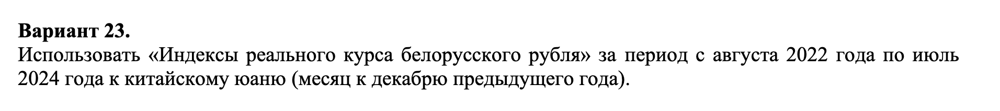

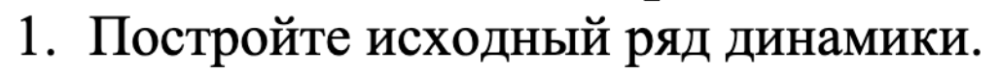

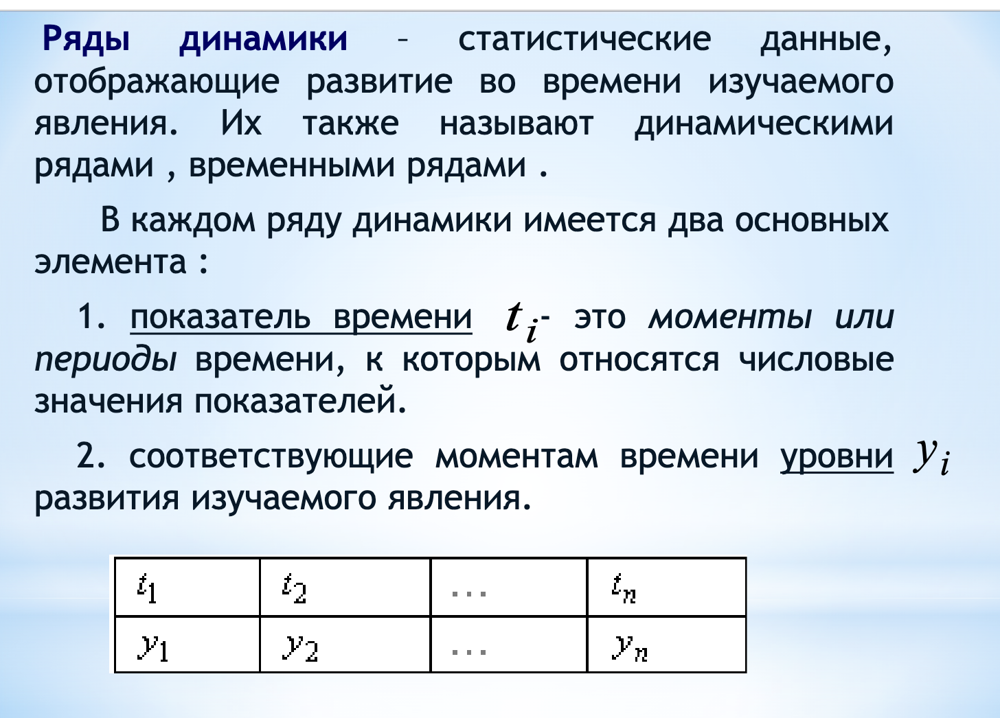

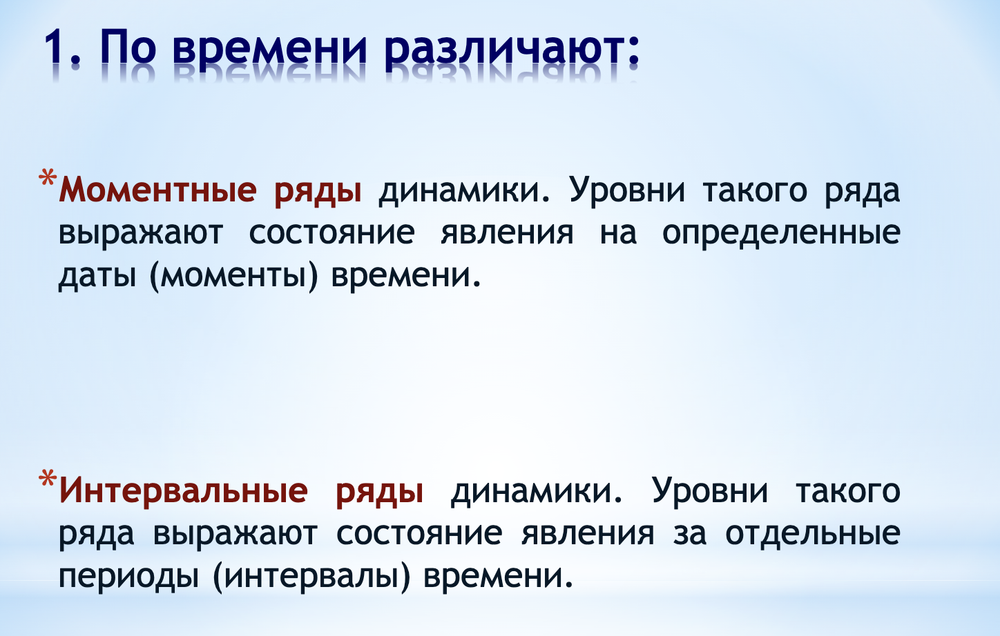

=== Исходный ряд динамики ===


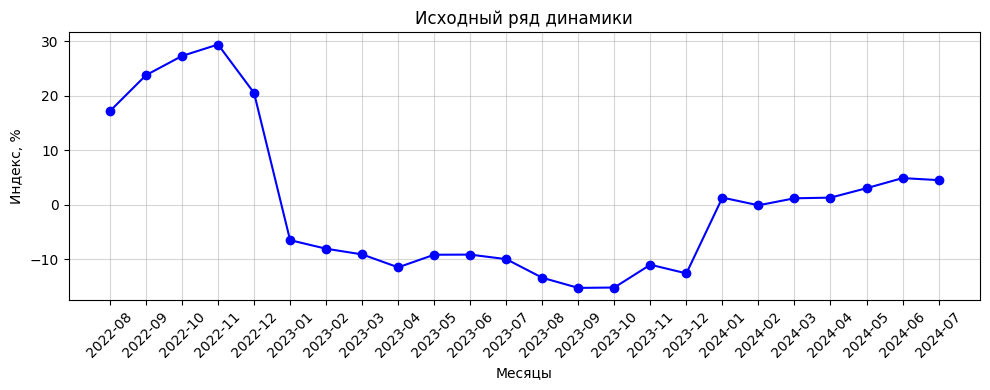

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

try:
    # загрузил
    df = pd.read_csv('data/data_lab5.csv')
    # добавил столбец времени
    df['t'] = np.arange(1, len(df) + 1)
    
    print("=== Исходный ряд динамики ===")
    
    plt.figure(figsize=(10, 4))
    plt.plot(df['Month'], df['Y'], marker='o', linestyle='-', color='blue')
    plt.title('Исходный ряд динамики')
    plt.xlabel('Месяцы')
    plt.ylabel('Индекс, %')
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.5)
    plt.tight_layout()
    plt.show()
except FileNotFoundError:
    print("Файл ге найден!")

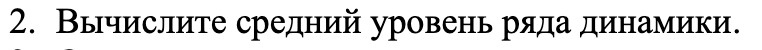

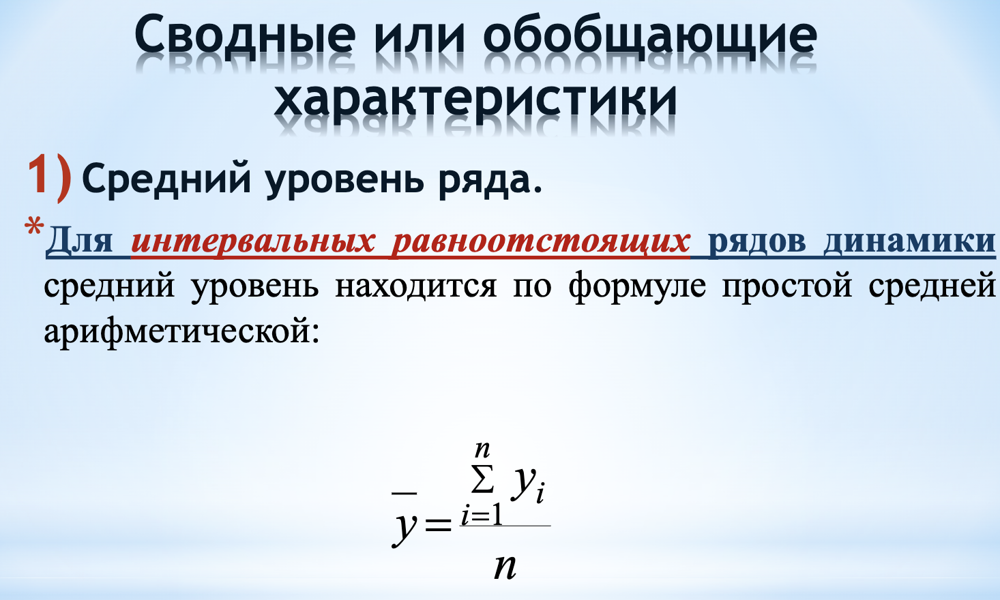

In [ ]:
y_mean = df['Y'].mean()
print(f"Средний уровень ряда динамики: {y_mean:.1f} %")

Средний уровень ряда динамики: 0.2 %


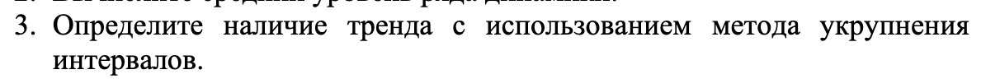

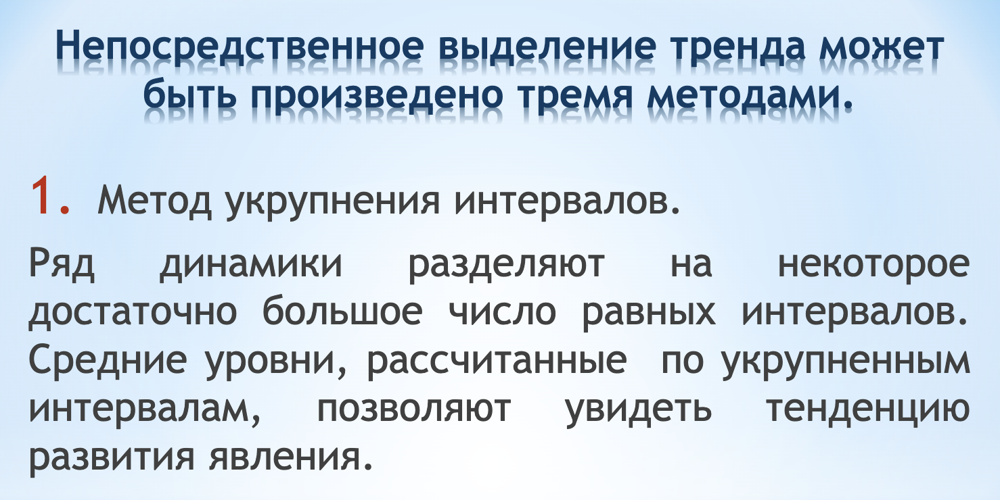

In [26]:
# 24 месяца. сделаем до кварталов (3 месяца в одной точке)
interval_size = 3
df['Quarter'] = (df['t'] - 1) // interval_size + 1

# считаем среднее для каждого укрупненного интервала
grouped = df.groupby('Quarter')['Y'].mean().reset_index()
grouped.columns = ['Укрупненный интервал', 'Средний уровень (Y)']
grouped['Средний уровень (Y)'] = grouped['Средний уровень (Y)'].round(1)

display(grouped)

# вывод
if grouped['Средний уровень (Y)'].iloc[-1] > grouped['Средний уровень (Y)'].iloc[0]:
    print("Вывод: При анализе укрупненных интервалов наблюдается тенденция к РОСТУ тренда.")
elif grouped['Средний уровень (Y)'].iloc[-1] < grouped['Средний уровень (Y)'].iloc[0]:
    print("Вывод: При анализе укрупненных интервалов наблюдается тенденция к СНИЖЕНИЮ тренда.")
else:
    print("Вывод: Ярко выраженный тренд отсутствует.")

,Укрупненный интервал,Средний уровень (Y)
0,1,22.7
1,2,14.5
2,3,-9.5
3,4,-9.4
4,5,-14.6
5,6,-7.4
6,7,0.8
7,8,4.1


Вывод: При анализе укрупненных интервалов наблюдается тенденция к СНИЖЕНИЮ тренда.


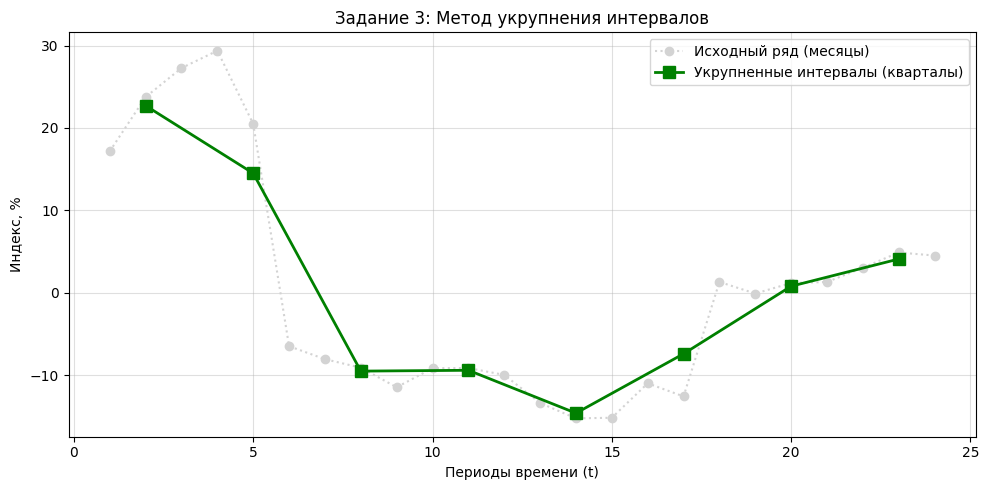

In [27]:
plt.figure(figsize=(10, 5))

# предыдущий
plt.plot(df['t'], df['Y'], marker='o', linestyle=':', color='lightgray', label='Исходный ряд (месяцы)')

# укрупненный
grouped_x_centers = [2, 5, 8, 11, 14, 17, 20, 23] 

plt.plot(grouped_x_centers, grouped['Средний уровень (Y)'], 
         marker='s', linestyle='-', color='green', markersize=8, linewidth=2, 
         label='Укрупненные интервалы (кварталы)')

plt.title('Задание 3: Метод укрупнения интервалов')
plt.xlabel('Периоды времени (t)')
plt.ylabel('Индекс, %')
plt.legend()
plt.grid(True, alpha=0.4)
plt.tight_layout()
plt.show()

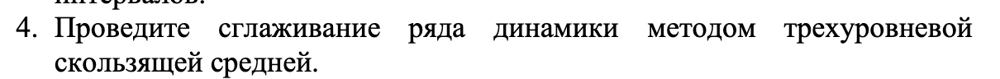

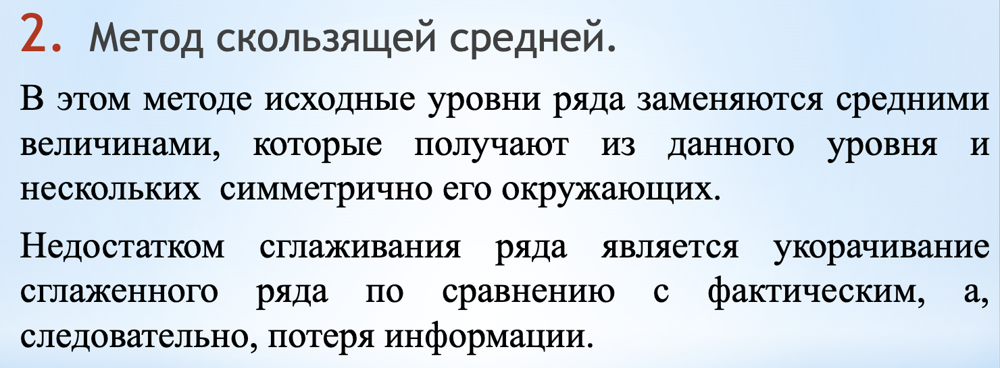

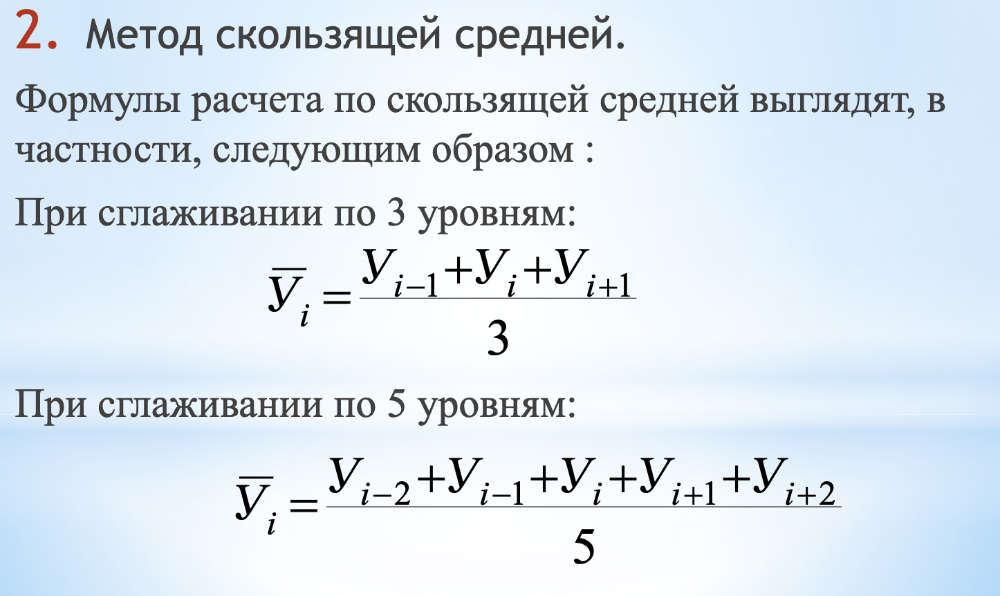

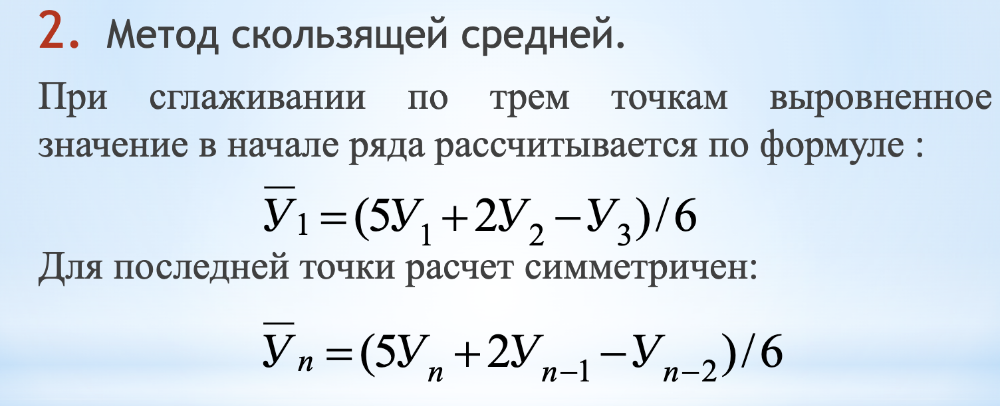

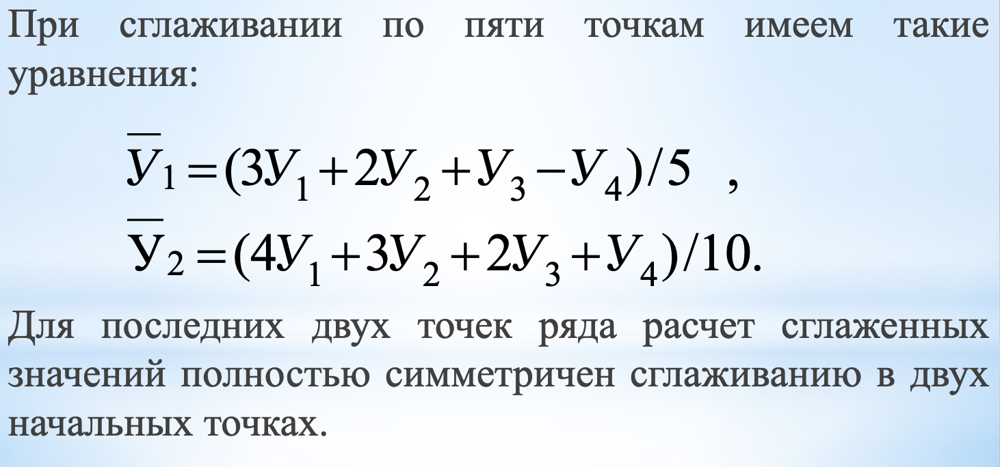

In [28]:
print("=== Трехуровневая скользящая средняя ===")

n = len(df)
y = df['Y'].values
y_smooth = np.zeros(n)

# первая точка
y_smooth[0] = (5*y[0] + 2*y[1] - y[2]) / 6

# для n-1
y_smooth[n-1] = (5*y[n-1] + 2*y[n-2] - y[n-3]) / 6

# для 2 до n-2
for i in range(1, n-1):
    y_smooth[i] = (y[i-1] + y[i] + y[i+1]) / 3

df['Y_smooth_3'] = np.round(y_smooth, 1)

print("Ряд, сглаженный трехуровневой скользящей средней:")
display(df[['Month', 'Y', 'Y_smooth_3']].head())

=== Трехуровневая скользящая средняя ===
Ряд, сглаженный трехуровневой скользящей средней:


,Month,Y,Y_smooth_3
0,2022-08,17.17,17.7
1,2022-09,23.75,22.7
2,2022-10,27.27,26.8
3,2022-11,29.37,25.7
4,2022-12,20.49,14.5


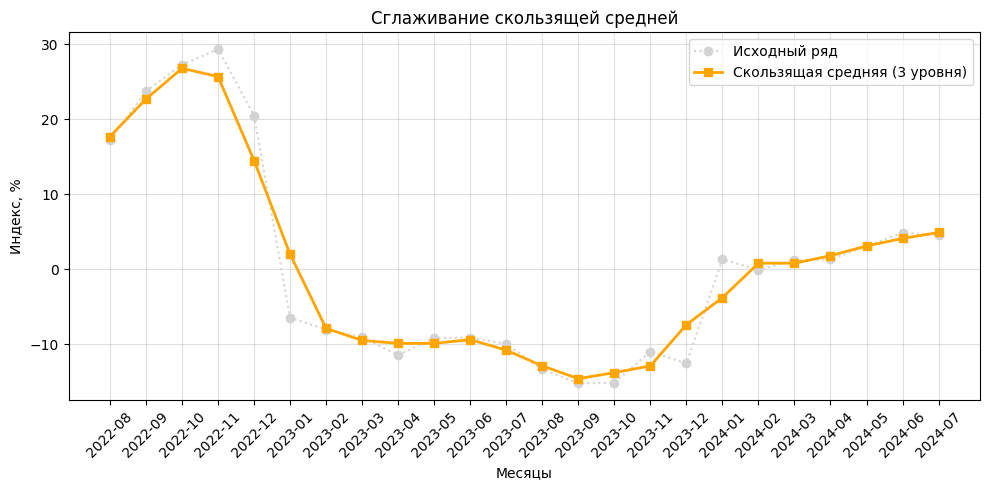

In [29]:
plt.figure(figsize=(10, 5))
plt.plot(df['Month'], df['Y'], marker='o', linestyle=':', color='lightgray', label='Исходный ряд')
plt.plot(df['Month'], df['Y_smooth_3'], marker='s', linestyle='-', color='orange', linewidth=2, label='Скользящая средняя (3 уровня)')

plt.title('Сглаживание скользящей средней')
plt.xlabel('Месяцы')
plt.ylabel('Индекс, %')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True, alpha=0.4)
plt.tight_layout()
plt.show()

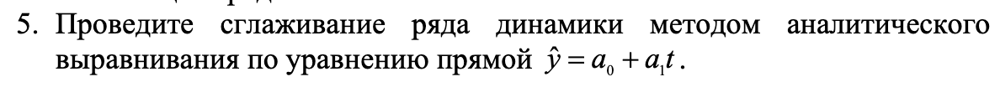

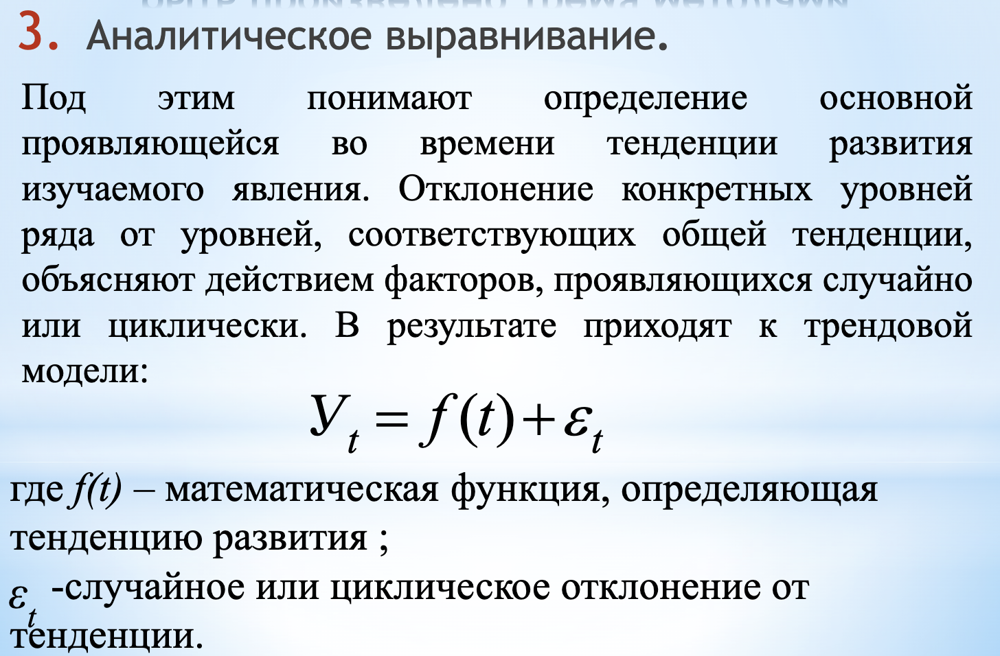

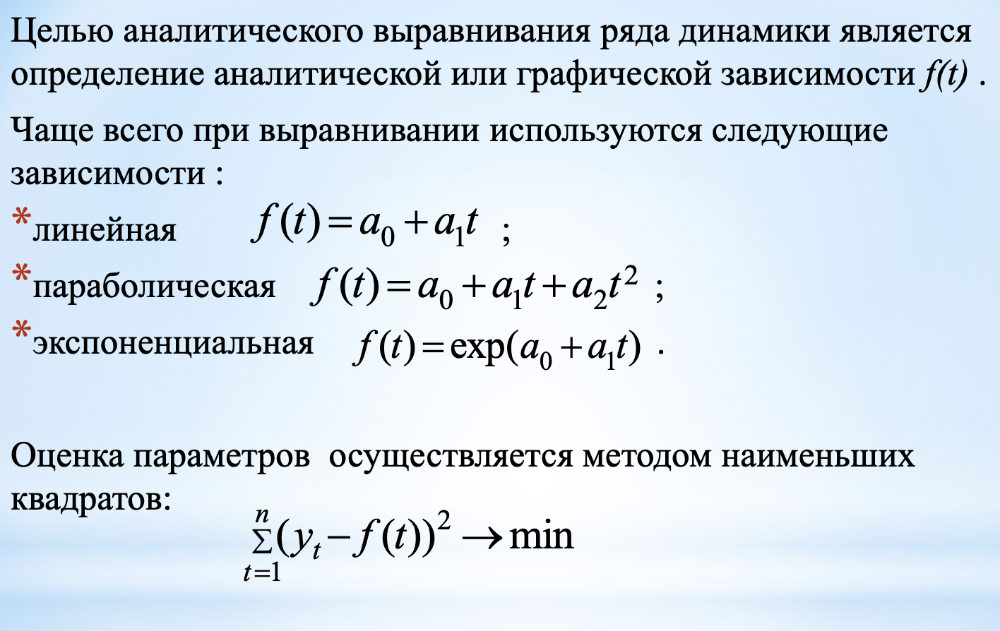

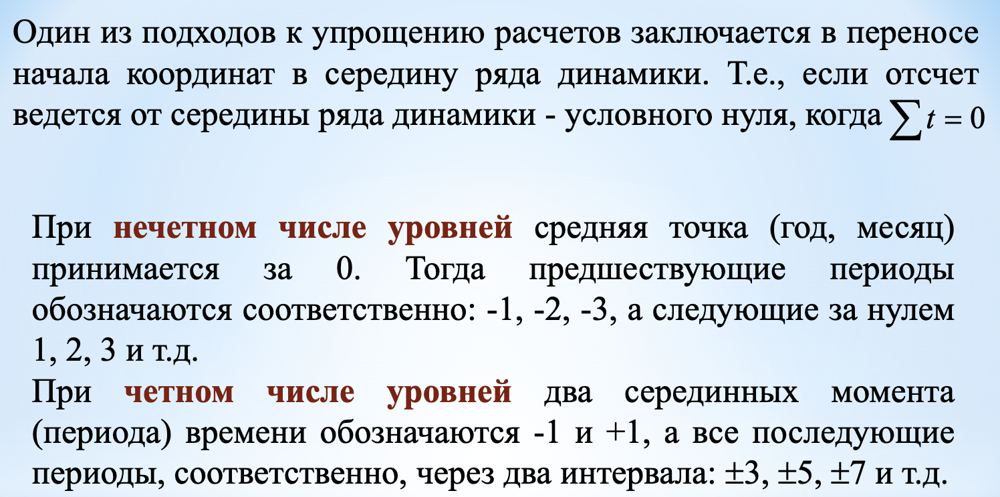

In [30]:
print("=== Аналитическое выравнивание ===")

# t у нас уже есть (1, 2, 3 ... 24)
t = df['t'].values
y = df['Y'].values

# np.polyfit(x, y, степень_полинома) возвращает коэффициенты
coeffs = np.polyfit(t, y, 1)
a1 = coeffs[0]
a0 = coeffs[1]

print(f"линейный тренд: Y^ = {a0:.1f} + ({a1:.1f}) * t")

# вычисляем выровненные значения для всего ряда
df['Y_trend'] = np.round(a0 + a1 * df['t'], 1)

=== Аналитическое выравнивание ===
линейный тренд: Y^ = 10.0 + (-0.8) * t


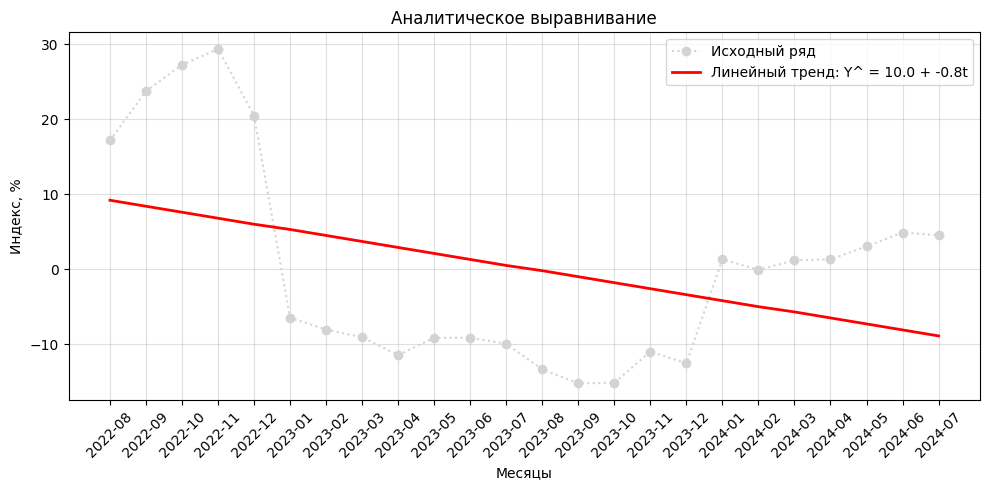

In [31]:
plt.figure(figsize=(10, 5))
plt.plot(df['Month'], df['Y'], marker='o', linestyle=':', color='lightgray', label='Исходный ряд')
plt.plot(df['Month'], df['Y_trend'], marker='', linestyle='-', color='red', linewidth=2, label=f'Линейный тренд: Y^ = {a0:.1f} + {a1:.1f}t')

plt.title('Аналитическое выравнивание')
plt.xlabel('Месяцы')
plt.ylabel('Индекс, %')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True, alpha=0.4)
plt.tight_layout()
plt.show()

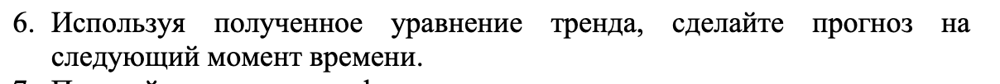

In [32]:
print("\n=== Прогноз ===")
# прогноз на следующий момент времени (t = 25, то есть это август 2024)
t_next = n + 1
y_forecast = a0 + a1 * t_next

print(f"Следующий момент времени t = {t_next} (Август 2024)")
print(f"Прогнозное значение индекса: {y_forecast:.1f} %")


=== Прогноз ===
Следующий момент времени t = 25 (Август 2024)
Прогнозное значение индекса: -9.7 %


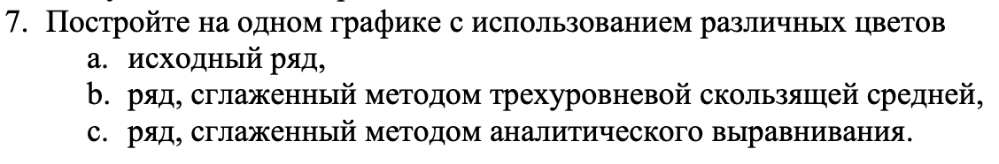

=== ЗАДАНИЕ 7: Итоговый график ===


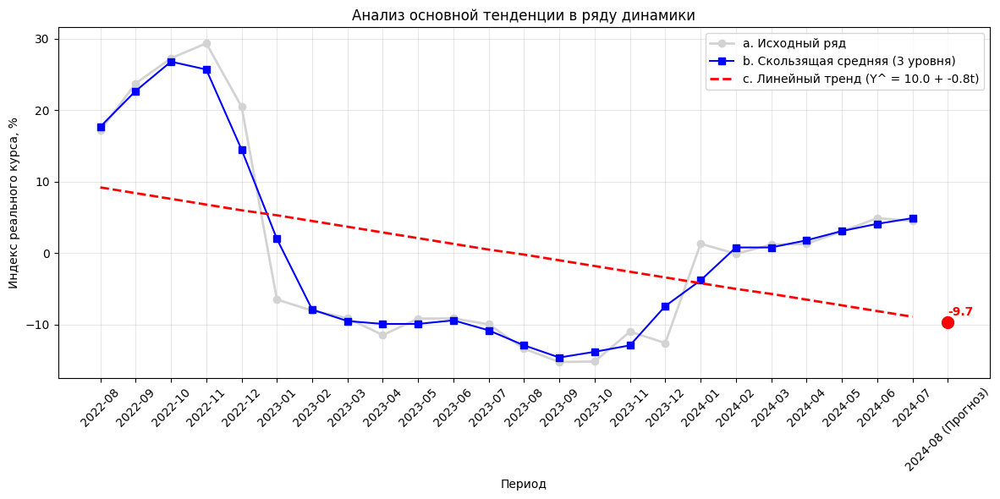

In [ ]:
plt.figure(figsize=(12, 6))

# a. Исходный ряд
plt.plot(df['Month'], df['Y'], marker='o', linestyle='-', color='lightgray', label='a. Исходный ряд', linewidth=2)

# b. Скользящая средняя
plt.plot(df['Month'], df['Y_smooth_3'], marker='s', linestyle='-', color='blue', label='b. Скользящая средняя (3 уровня)')

# c. Аналитическое выравнивание 
plt.plot(df['Month'], df['Y_trend'], marker='', linestyle='--', color='red', label=f'c. Линейный тренд (Y^ = {a0:.1f} + {a1:.1f}t)', linewidth=2)

# Точку прогноза
plt.scatter(['2024-08 (Прогноз)'], [y_forecast], color='red', s=100, zorder=5)
plt.text('2024-08 (Прогноз)', y_forecast + 1, f'{y_forecast:.1f}', color='red', fontweight='bold')

plt.title('Анализ основной тенденции в ряду динамики')
plt.xlabel('Период')
plt.ylabel('Индекс реального курса, %')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.show()